In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
os.environ["OMP_NUM_THREADS"] = "1"  # Set it to your desired number of threads
import missingno as msno

from IPython.display import display #To display dataframe with a nice format.

# Setting display precision for pandas
pd.set_option("display.precision", 2)
# Set display option to show all columns
pd.set_option('display.max_columns', None)

blue_green      = (82/255, 162/255, 160/255)
blue_green_dark = (41/255, 81/255, 81/255)

# ==================================================================================================
# Set the fontsize & Bold for each GRAPH !!!
# ==================================================================================================
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 14
plt.rcParams["axes.titleweight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams["lines.linewidth"] = 3
plt.rcParams["lines.markersize"] = 10
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams['axes.titlepad'] = 20 

In [2]:
# ==================================================================================================
# READ DATA
# ==================================================================================================
import csv
url_df_data               = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET6_Classifiez_automatiquement_des_biens_de_consommation\DATA\Flipkart\flipkart_com-ecommerce_sample_1050.csv"
df_data = pd.read_csv(url_df_data)

print("Datasets loaded succesfully ! :D")

Datasets loaded succesfully ! :D


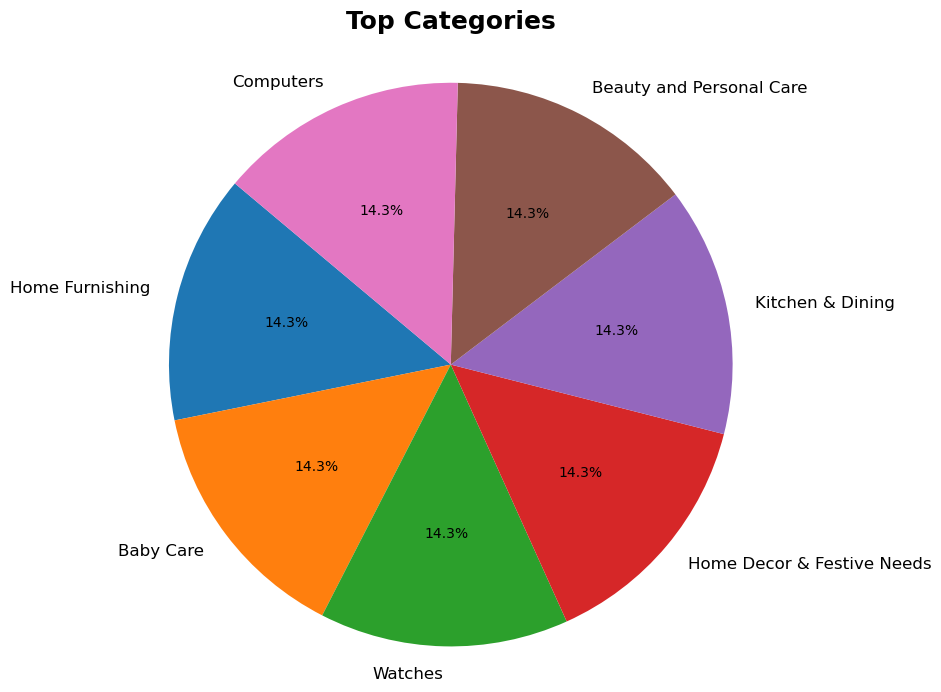

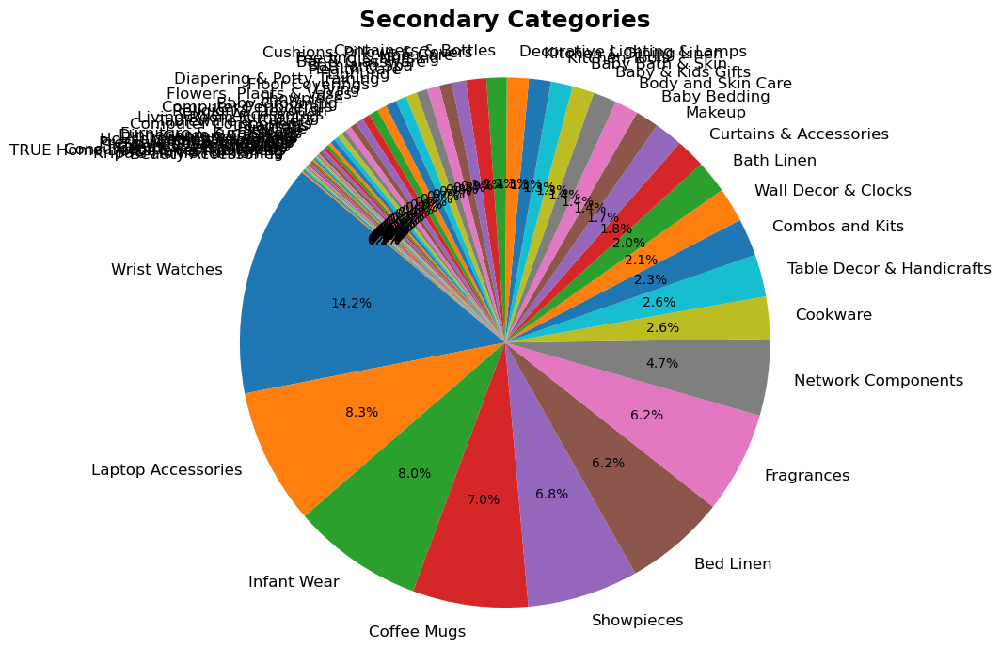

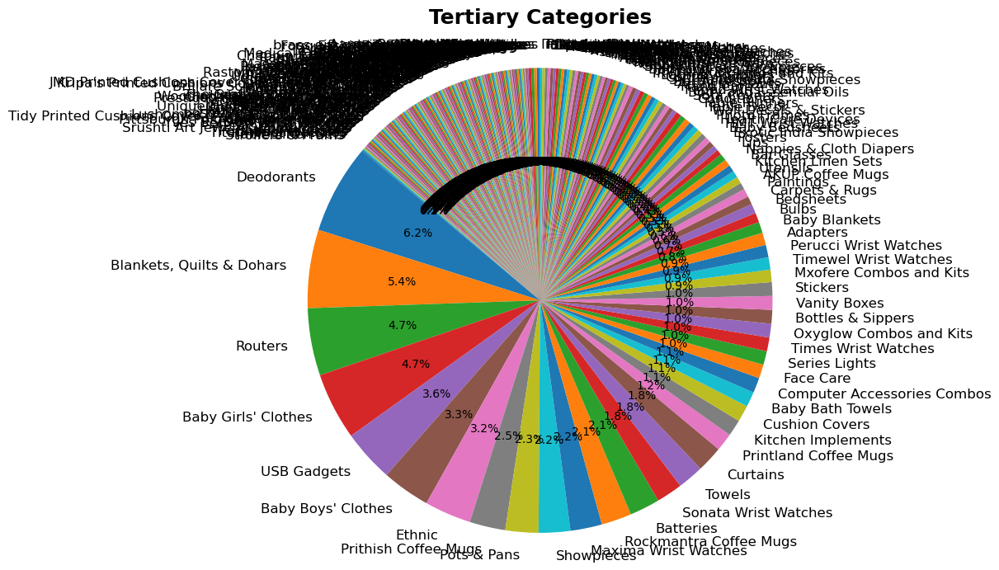

Number of unique top categories: 7
Number of unique secondary categories: 62
Number of unique tertiary categories: 241


In [3]:
# ==================================================================================================
# TRUE LABELS
# TOP, SECONDARY and TERTIARY CATEGORIES
# ==================================================================================================
# Function to extract top, secondary, and tertiary categories
def extract_categories(category_tree):
    # Split the category tree string and get categories
    categories = category_tree.strip('[]').split(">>")
    
    # Extract top category
    top_category = categories[0].strip().replace('"', '')
    
    # Extract secondary category if available
    secondary_category = categories[1].strip().replace('"', '') if len(categories) > 1 else None
    
    # Extract tertiary category if available
    tertiary_category = categories[2].strip().replace('"', '') if len(categories) > 2 else None
    
    return top_category, secondary_category, tertiary_category

# Apply the function to each row in the DataFrame
df_data['top_category'], df_data['secondary_category'], df_data['tertiary_category'] = zip(*df_data['product_category_tree'].apply(extract_categories))

# Extract unique categories
unique_top_categories = df_data['top_category'].unique()
unique_secondary_categories = df_data['secondary_category'].unique()
unique_tertiary_categories = df_data['tertiary_category'].unique()

# Function to plot pie chart for category distribution
def plot_category_pie_chart(categories, title):
    # Count the frequency of each category
    category_counts = categories.value_counts()
    
    # Plot pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
    plt.show()

# Plot pie chart for top categories
plot_category_pie_chart(df_data['top_category'], 'Top Categories')

# Plot pie chart for secondary categories
plot_category_pie_chart(df_data['secondary_category'], 'Secondary Categories')

# Plot pie chart for tertiary categories
plot_category_pie_chart(df_data['tertiary_category'], 'Tertiary Categories')



# ==================================================================================================
# COUNT NUMBER OF CATEGORY IN TOP, SECONDARY and TERTIARY
# ==================================================================================================
# Extract unique categories
nunique_top_categories = df_data['top_category'].nunique()
nunique_secondary_categories = df_data['secondary_category'].nunique()
nunique_tertiary_categories = df_data['tertiary_category'].nunique()

print("Number of unique top categories:", nunique_top_categories)
print("Number of unique secondary categories:", nunique_secondary_categories)
print("Number of unique tertiary categories:", nunique_tertiary_categories)

# IMPTUE TERTIARY CATEGORY
df_data['tertiary_category'].fillna("NO TERTIARY CATEGORY", inplace=True)

In [4]:
category_counts = df_data['top_category'].value_counts()
category_counts_df = category_counts.to_frame().reset_index()
category_counts_df.columns = ['Category', 'Count']
display(category_counts_df)


,Category,Count
0,Home Furnishing,150
1,Baby Care,150
2,Watches,150
3,Home Decor & Festive Needs,150
4,Kitchen & Dining,150
5,Beauty and Personal Care,150
6,Computers,150


# PHOTO PREPROCESSING TEST

In [5]:
# ==================================================================================================
# CASE N PHOTOS
# ==================================================================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Step 1: Image Preprocessing
def preprocess_image(image, method='otsu', target_size=None, equalize_hist=False):
    # Resize image while preserving aspect ratio
    if target_size is not None:
        # Calculate aspect ratio of the original image
        original_height, original_width = image.shape[:2]
        aspect_ratio = original_width / original_height
        
        # Determine the dimension to resize based on the aspect ratio
        target_width, target_height = target_size
        if target_width / target_height > aspect_ratio:
            new_width = int(target_height * aspect_ratio)
            new_height = target_height
        else:
            new_width = target_width
            new_height = int(target_width / aspect_ratio)
        
        # Resize the image
        image = cv2.resize(image, (new_width, new_height))
    
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Equalize histogram if specified
    if equalize_hist:
        gray_image = cv2.equalizeHist(gray_image)
    
    # blurred_image = cv2.GaussianBlur(gray_image, (7, 7), 0)
    
    # if method == 'otsu':
    #     _, processed_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # elif method == 'adaptive':
    #     processed_image = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    # elif method == 'canny':
    #     processed_image = cv2.Canny(blurred_image, 30, 150)
    # else:
    #     raise ValueError("Invalid method. Choose 'otsu', 'adaptive', or 'canny'.")
    
    processed_image = gray_image
    return processed_image



# Step 2: Feature Extraction
def extract_features(image):
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(image, None)
    return keypoints, descriptors

# I. BASIC FEATURE EXTRACTION

## I.1. CREATING A REPRESENTATIVE SAMPLES OF THE DISTRIBUTION OF THE POPULATION

In [6]:
# ==================================================================================================
# Create a representive samples of the population
# ==================================================================================================
import os
import random

# Load image paths and their corresponding categories
folder_path = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET6_Classifiez_automatiquement_des_biens_de_consommation\DATA\Flipkart\Images"
image_files = os.listdir(folder_path)
image_paths = [os.path.join(folder_path, image_file) for image_file in image_files]

# Define the number of images to sample from each category
sample_size_per_category = 150 #max : 150

# Initialize lists to store selected image paths and their corresponding labels
selected_image_paths = []
image_labels = []

# Iterate over each image category
for category in df_data['top_category'].unique():
    # Filter image paths for the current category
    category_image_paths = [image_path for image_path in image_paths if image_path.split(os.sep)[-1].split('.')[0] in df_data[df_data['top_category'] == category]['uniq_id'].values]
    
    # If the number of images in the category is less than the sample size, use all images
    if len(category_image_paths) <= sample_size_per_category:
        selected_image_paths.extend(category_image_paths)
    else:
        # Randomly sample images from the category
        selected_image_paths.extend(random.sample(category_image_paths, sample_size_per_category))
    
    # Add corresponding labels
    image_labels.extend([category] * sample_size_per_category)

# Count the number of unique categories used when selecting the photos
unique_categories_selected = len(set(image_labels))
print("Number of unique categories selected:", unique_categories_selected)

Number of unique categories selected: 7


In [7]:
# # ==================================================================================================
# # Create a new set of photos (rotated and scaled)
# # ==================================================================================================
# import cv2
# import os

# # Function to rotate image by a given angle
# def rotate_image(image, angle):
#     rows, cols = image.shape[:2]
#     M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
#     rotated_image = cv2.warpAffine(image, M, (cols, rows))
#     return rotated_image

# # Function to scale image by a given factor
# def scale_image(image, scale_factor):
#     scaled_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
#     return scaled_image

# # Define the directory to save augmented images
# output_dir = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET6_Classifiez_automatiquement_des_biens_de_consommation\DATA\Flipkart\Images_scaled_rotated"

# # Ensure the output directory exists, otherwise create it
# os.makedirs(output_dir, exist_ok=True)

# # Define the number of rotation steps and scale steps
# rotation_steps = 5
# scale_steps = 5

# # Iterate over selected image paths and augment each image
# for idx, image_path in enumerate(selected_image_paths):
#     image = cv2.imread(image_path)
    
#     # Rotate the image by different angles
#     for rotation_step in range(rotation_steps):
#         angle = 360 / rotation_steps * rotation_step
#         rotated_image = rotate_image(image, angle)
#         cv2.imwrite(os.path.join(output_dir, f"rotated_{angle}_{idx}.jpg"), rotated_image)
    
#     # Scale the image by different factors
#     for scale_step in range(scale_steps):
#         scale_factor = 1 + 0.1 * scale_step  # Scale factors from 1.0 to 1.4
#         scaled_image = scale_image(image, scale_factor)
#         cv2.imwrite(os.path.join(output_dir, f"scaled_{scale_factor}_{idx}.jpg"), scaled_image)

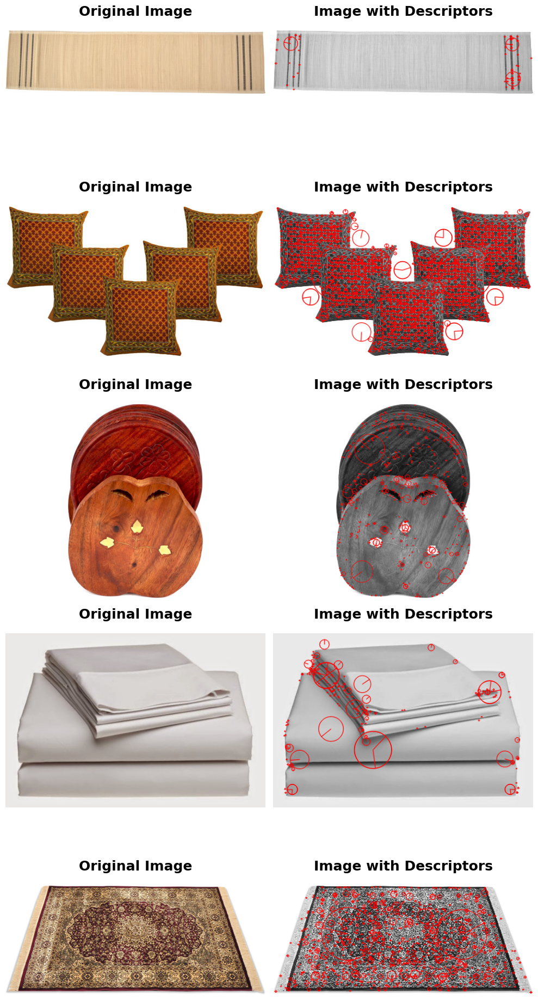

In [8]:
# ==================================================================================================
# ORIGINAL VS PREPRECCED + FEATURE EXTRACTOR
# ==================================================================================================
fig, axes = plt.subplots(5, 2, figsize=(10, 20))

for i, image_path in enumerate(selected_image_paths[:5]):
    # Load image
    image = cv2.imread(image_path)
    
    # Preprocess image
    processed_image = preprocess_image(image, method='adaptive', target_size=(500, 500))
    
    # Extract keypoints and descriptors
    keypoints, descriptors = extract_features(processed_image)
    
    # Visualize original image
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')
    
    # Visualize image with descriptors
    image_with_descriptors = cv2.drawKeypoints(processed_image, keypoints, None, color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    axes[i, 1].imshow(image_with_descriptors, cmap='gray')
    axes[i, 1].set_title('Image with Descriptors')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

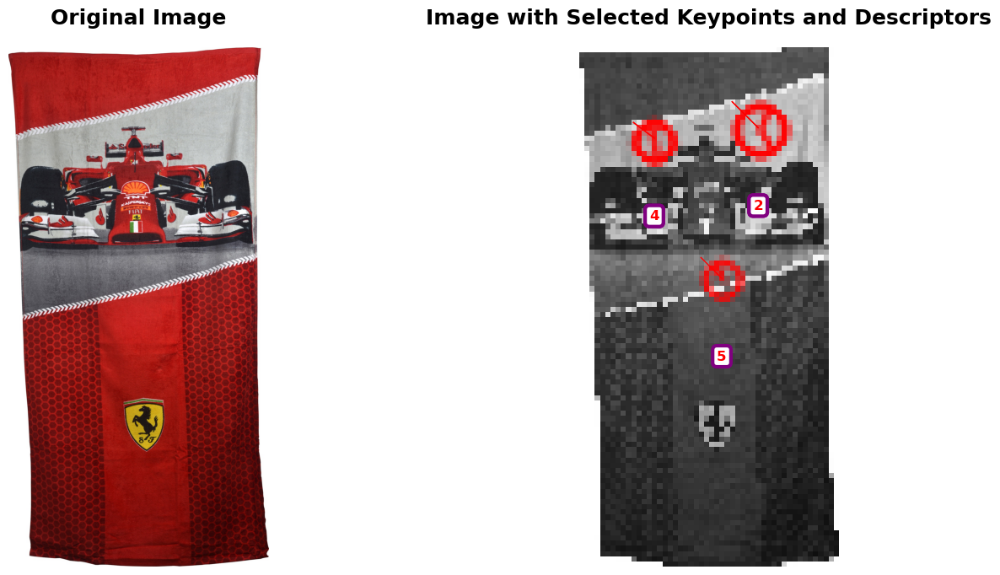

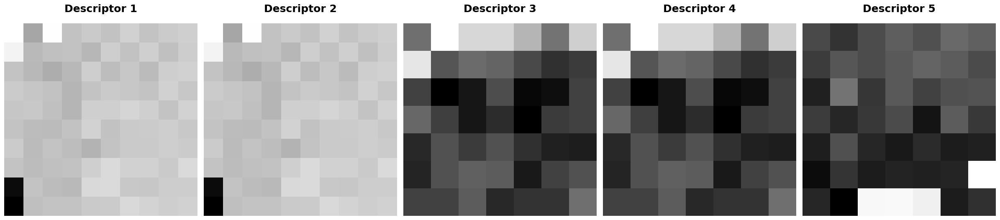

In [9]:
# Load an image
image_path = selected_image_paths[100]  # Change this to the desired image path
image = cv2.imread(image_path)

# Preprocess the image
processed_image = preprocess_image(image, method='adaptive', target_size=(100, 100))

# Extract keypoints and descriptors from the preprocessed image
keypoints, descriptors = extract_features(processed_image)

# Sort keypoints based on size (largest to smallest)
sorted_keypoints = sorted(keypoints, key=lambda x: x.size, reverse=True)

# Select the biggest 5 keypoints
biggest_keypoints = sorted_keypoints[:5]

# Visualize image with selected keypoints and descriptors
image_with_selected_keypoints = cv2.drawKeypoints(processed_image, biggest_keypoints, None, color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Create a figure with subplots for original image and image with selected keypoints and descriptors
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot the original image
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

# Plot the image with selected keypoints and descriptors
axes[1].imshow(image_with_selected_keypoints)
axes[1].set_title('Image with Selected Keypoints and Descriptors')

# Draw lines connecting keypoints to descriptors and add text annotations
for i, keypoint in enumerate(biggest_keypoints):
    x, y = keypoint.pt
    size = keypoint.size
    x_center = int(x)
    y_center = int(y)
    descriptor_x = int(x - size / 2)
    descriptor_y = int(y - size / 2)
    axes[1].plot([x_center, descriptor_x], [y_center, descriptor_y], 'r-', lw=1)
    # Add background overlay around the text
    bbox_props = dict(boxstyle="round,pad=0.3", fc="white", ec="purple", lw=3, alpha=1)
    axes[1].text(x_center, y_center+15, str(i+1), color='red', fontsize=12, ha='center', va='center', fontweight='bold', bbox=bbox_props)

axes[1].axis('off')


plt.show()

# Display descriptors for the biggest keypoints with larger images
fig, axes = plt.subplots(1, 5, figsize=(24, 6))  # Increase the figsize for larger descriptor images

for i, keypoint in enumerate(biggest_keypoints):
    x, y = keypoint.pt
    size = keypoint.size
    # Crop the region around the keypoint
    descriptor_image = processed_image[int(y-size/2):int(y+size/2), int(x-size/2):int(x+size/2)]
    axes[i].imshow(descriptor_image, cmap='gray')
    axes[i].set_title(f'Descriptor {i+1}')
    axes[i].axis('off')
    # Add a line to connect the descriptor to its corresponding keypoint in the original image
    axes[i].plot([size/2, size/2], [size/2, size/2], 'r-', lw=1)  # Adjust the line position if needed

plt.tight_layout()
plt.show()


## I.2. IMAGE CLASSIFICATION USING BASIC FEATURE EXTRACTION ALGORITHMS (SIFT, ORB, ...)

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import time
from sklearn import cluster, metrics
from itertools import permutations
 
def image_classification_cluster():   
    # ==================================================================================================
    # FEATURE EXTRACTION
    # ==================================================================================================
    temps1=time.time()
    
    # Load and preprocess selected images
    all_descriptors = []
    image_labels = []
    sift_keypoints_by_img = []
    
    for image_path in selected_image_paths:
        # Load image
        image = cv2.imread(image_path)
        processed_image = preprocess_image(image, method='otsu', target_size=(400, 400))         # Preprocess image
        keypoints, descriptors = extract_features(processed_image)         # Extract descriptors
        sift_keypoints_by_img.append((keypoints, descriptors))         # Store keypoints and descriptors by image
        if descriptors is not None:
            all_descriptors.extend(descriptors)
            
            image_id = os.path.basename(image_path).split('.')[0]             # Extract image ID from file name
            label = df_data.loc[df_data['uniq_id'] == image_id, 'top_category'].values             # Get label from DataFrame using image ID
            if len(label) > 0:
                image_labels.extend([label[0]] * len(descriptors))
            else:
                # If label not found, assign a default category
                image_labels.extend(['Other'] * len(descriptors))
    
    # Convert the list of descriptors to a numpy array
    all_descriptors = np.array(all_descriptors)
    
    
    print()
    print("Nombre de descripteurs : ", all_descriptors.shape)
    
    duration1=time.time()-temps1
    duration_extractor_time = duration1
    print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")
    
    # ==================================================================================================
    # CREATION OF CLUSTERS OF DESCRIPTORS
    # ==================================================================================================
    
    # Determination number of clusters
    temps1=time.time()
    
    k = int(round(np.sqrt(len(all_descriptors)),0))
    print("Nombre de clusters estimés : ", k)
    print("Création de",k, "clusters de descripteurs ...")
    
    # Clustering
    kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
    kmeans.fit(all_descriptors)
    
    duration1=time.time()-temps1
    print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")
    
    # ==================================================================================================
    # CREATION OF HISTOGRAMS (FEATURES) - BAG of VISUAL WORDS
    # ==================================================================================================
    temps1=time.time()
    
    def build_histogram(kmeans, des, image_num):
        if des is None:
            print("No descriptors found in image:", image_num)
            return np.zeros(len(kmeans.cluster_centers_))
            
        res = kmeans.predict(des)
        hist = np.zeros(len(kmeans.cluster_centers_))
        nb_des=len(des)
        if nb_des==0 : print("problème histogramme image  : ", image_num)
        for i in res:
            hist[i] += 1.0/nb_des
        return hist
    
    
    # Creation of a matrix of histograms
    hist_vectors=[]
    
    for i, image_desc in enumerate(sift_keypoints_by_img) :
        if i%100 == 0 : print(i)
    
        hist = build_histogram(kmeans, image_desc[1], i) #calculates the histogram
        hist_vectors.append(hist) #histogram is the feature vector
    
    im_features = np.asarray(hist_vectors)
    duration1=time.time()-temps1
    print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")
    
    # ==================================================================================================
    # DIMENSIONAL REDUCTION
    # ==================================================================================================
    # Apply PCA for dimensionality reduction
    print("Dimensions dataset avant réduction PCA : ", im_features.shape)
    pca = PCA(n_components=0.99)  # Retain 95% of variance
    reduced_descriptors_pca = pca.fit_transform(im_features)
    print("Dimensions dataset après réduction PCA : ", reduced_descriptors_pca.shape)
    
    # Apply t-SNE for dimensionality reduction
    tsne = TSNE(n_components=2)
    X_tsne = tsne.fit_transform(reduced_descriptors_pca)
    
    df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
    df_tsne["class"] = df_data['top_category']
    print(df_tsne.shape)
    
    # Define a custom color palette
    color_palette = sns.color_palette('tab10')
    
    
    # ==================================================================================================
    # VISUAL ANALYSIS - TRUE LABELS
    # ==================================================================================================
    plt.figure(figsize=(10,6))
    sns.scatterplot(
        x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
        palette=color_palette, s=200, alpha=0.6)
    
    plt.title('TSNE - True Labels')
    plt.xlabel('tsne1')
    plt.ylabel('tsne2')
    plt.legend() 
    
    plt.show()
    
    
    # ==================================================================================================
    # VISUAL ANALYSIS - PREDICTED LABELS - NO COLOR MAPPING
    # ==================================================================================================
    cls = cluster.KMeans(n_clusters=nunique_top_categories, random_state=42)
    cls.fit(X_tsne)
    
    df_tsne["cluster"] = cls.labels_
    
    plt.figure(figsize=(10,6))
    sns.scatterplot(
        x="tsne1", y="tsne2", hue="cluster", palette=color_palette, s=200, alpha=0.6,
        data=df_tsne, legend="brief")
    
    plt.title('TSNE - Predicted Labels (NO COLOR MAPPING)')
    plt.xlabel('tsne1')
    plt.ylabel('tsne2')
    plt.legend(prop={'size': 14}) 
    
    plt.show()
    
    # ==================================================================================================
    # EVALUATION METRICS - ARI
    # ==================================================================================================
    true_labels = df_tsne['class']
    predicted_labels = df_tsne['cluster']
    
    # Calculate Adjusted Rand Index (ARI)
    ari = metrics.adjusted_rand_score(true_labels, predicted_labels)
    print("Adjusted Rand Index (ARI):", ari)
    

    # ==================================================================================================
    # EVALUATION METRICS - ACCURACY
    # ==================================================================================================
    # True labels and predicted labels
    true_labels = df_tsne['class'].unique()
    predicted_labels = df_tsne['cluster'].unique()
    
    # Try all possible permutations of label mappings
    best_accuracy = 0
    best_mapping = None
    
    for permuted_labels in permutations(true_labels):
        label_mapping = dict(zip(predicted_labels, permuted_labels))
        accuracy = np.mean(df_tsne['class'] == df_tsne['cluster'].map(label_mapping))
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_mapping = label_mapping
    
    print("Best Label Mapping:", best_mapping)
    print("Best Accuracy:", best_accuracy)
    
    # ==================================================================================================
    # VISUAL ANALYSIS - PREDICTED LABELS - WITH COLOR MAPPING
    # ==================================================================================================
    # Define colors for each unique top category manually
    top_category_color_dict = {
        'Home Furnishing': '#ff7f0e',              # Orange
        'Baby Care': '#2ca02c',                    # Green
        'Watches': '#1f77b4',                      # Blue
        'Home Decor & Festive Needs': '#d62728',   # Red
        'Kitchen & Dining': '#9467bd',             # Purple
        'Beauty and Personal Care': '#8c564b',     # Brown
        'Computers': '#e377c2'                     # Pink
    }
    
    # Create a custom legend with category names
    legend_labels = list(top_category_color_dict.keys())
    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=10) 
                      for label, color in top_category_color_dict.items()]
    
    # Update the predicted labels plot with the colors of the true labels
    predicted_labels_colors = df_tsne['cluster'].map(best_mapping).map(top_category_color_dict)


    # ==================================================================================================
    # VISUAL ANALYSIS - PREDICTED LABELS  RECOLORED PLOTS 
    # ==================================================================================================
    # Create a figure with two subplots side by side
    plt.figure(figsize=(20, 6))
    
    # Plot the first subplot
    plt.subplot(1, 2, 1)
    sns.scatterplot(
        x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
        palette=color_palette, s=200, alpha=0.6)
    plt.title('TSNE - True Labels')
    plt.xlabel('tsne1')
    plt.ylabel('tsne2')
    plt.legend()
    
    # Plot the second subplot
    plt.subplot(1, 2, 2)
    sns.scatterplot(
        x="tsne1", y="tsne2", hue=predicted_labels_colors, palette=top_category_color_dict.values(),
        data=df_tsne, legend=False, s=200, alpha=0.6)
    plt.title('TSNE - Predicted Labels WITH Color Mapping')
    plt.xlabel('tsne1')
    plt.ylabel('tsne2')
    plt.legend(handles=legend_handles, labels=legend_labels, loc='lower right', framealpha=0.4)
    
    # Adjust layout and show the combined figure
    # plt.tight_layout()
    plt.show()

    return ari, best_accuracy, duration_extractor_time, all_descriptors.shape, k



Nombre de descripteurs :  (350279, 128)
temps de traitement SIFT descriptor :            36.54 secondes
Nombre de clusters estimés :  592
Création de 592 clusters de descripteurs ...
temps de traitement kmeans :             4.20 secondes
0
100
200
300
400
500
600
700
800
900
No descriptors found in image: 983
1000
temps de création histogrammes :             1.25 secondes
Dimensions dataset avant réduction PCA :  (1050, 592)
Dimensions dataset après réduction PCA :  (1050, 449)
(1050, 3)


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:125: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


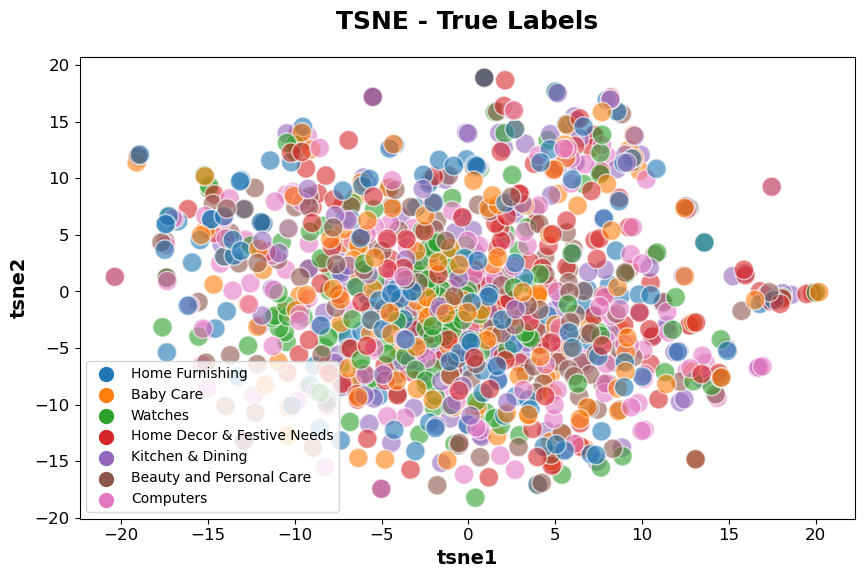

C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:146: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


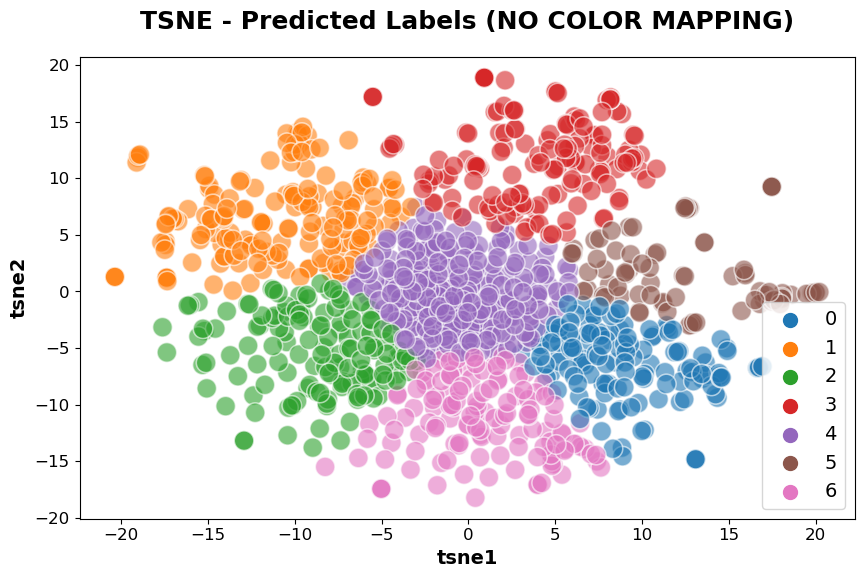

Adjusted Rand Index (ARI): 0.007840534401578204
Best Label Mapping: {5: 'Home Decor & Festive Needs', 2: 'Baby Care', 3: 'Home Furnishing', 0: 'Beauty and Personal Care', 6: 'Kitchen & Dining', 1: 'Computers', 4: 'Watches'}
Best Accuracy: 0.20285714285714285


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:220: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


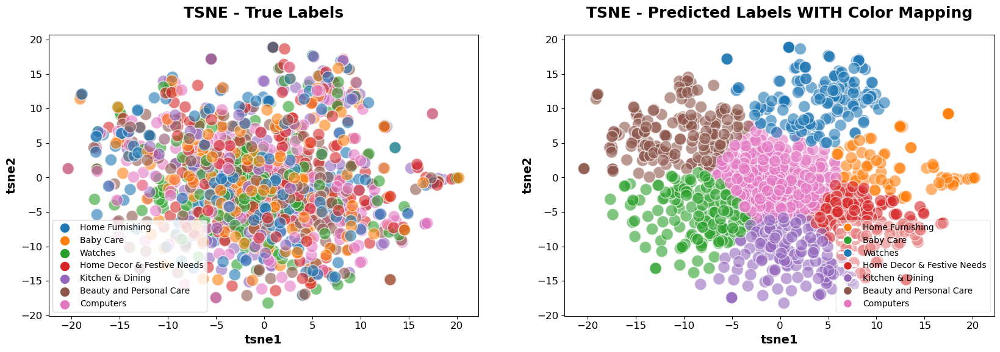

In [11]:
# ==================================================================================================
# SIFT - FEATURESS EXTRACTION
# ==================================================================================================
def extract_features(image):
    sift = cv2.SIFT_create(500)
    keypoints, descriptors = sift.detectAndCompute(image, None)
    return keypoints, descriptors

ari, best_accuracy, duration_extractor_time, nb_descriptors, nb_clusters = image_classification_cluster()


# Create an empty list to store results
results_list = []
results_list.append({'EXTRACTOR METHOD': 'SIFT', 'ARI': ari, 'Best Accuracy': best_accuracy, 'Temps de traitement': duration_extractor_time, 'Nb Descripteurs' : nb_descriptors, 'Nb Clusters' : nb_clusters})
df_results = pd.DataFrame(results_list) # Convert the list of dictionaries to a DataFrame



Nombre de descripteurs :  (436277, 32)
temps de traitement SIFT descriptor :            22.18 secondes
Nombre de clusters estimés :  661
Création de 661 clusters de descripteurs ...
temps de traitement kmeans :             3.33 secondes
0
100
200
300
400
500
600
700
800
900
No descriptors found in image: 968
No descriptors found in image: 983
1000
No descriptors found in image: 1014
No descriptors found in image: 1017
No descriptors found in image: 1044
temps de création histogrammes :             1.50 secondes
Dimensions dataset avant réduction PCA :  (1050, 661)
Dimensions dataset après réduction PCA :  (1050, 528)
(1050, 3)


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:125: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


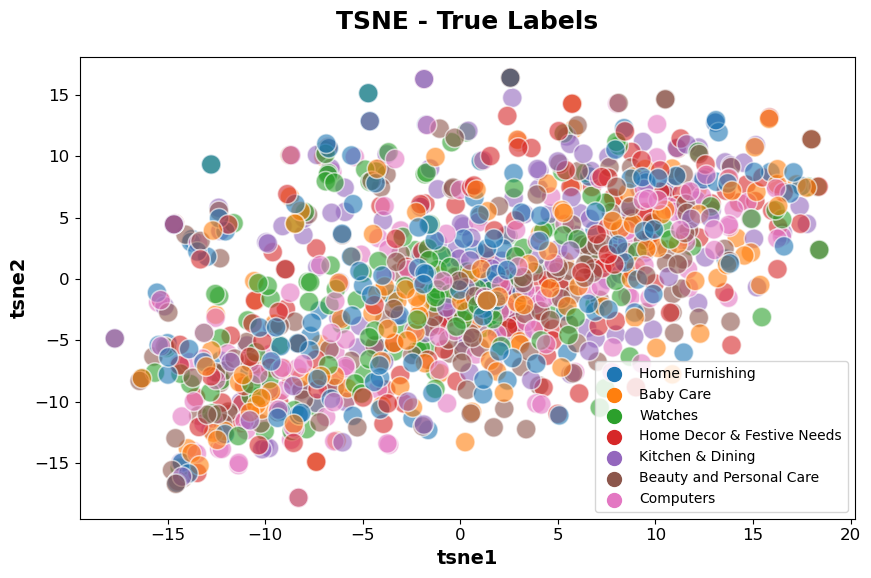

C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:146: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


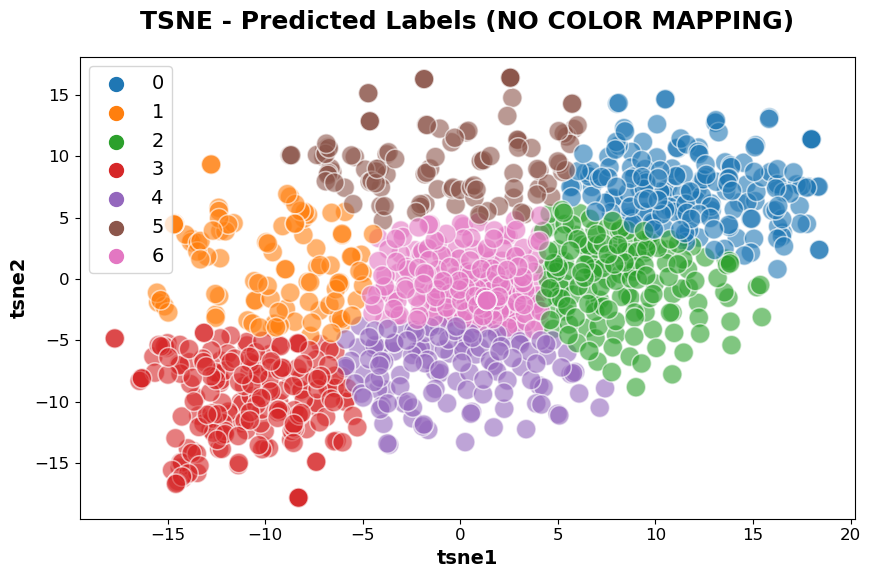

Adjusted Rand Index (ARI): 0.0030501347829342165
Best Label Mapping: {0: 'Home Decor & Festive Needs', 1: 'Home Furnishing', 2: 'Beauty and Personal Care', 6: 'Watches', 4: 'Baby Care', 5: 'Kitchen & Dining', 3: 'Computers'}
Best Accuracy: 0.19142857142857142


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:220: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


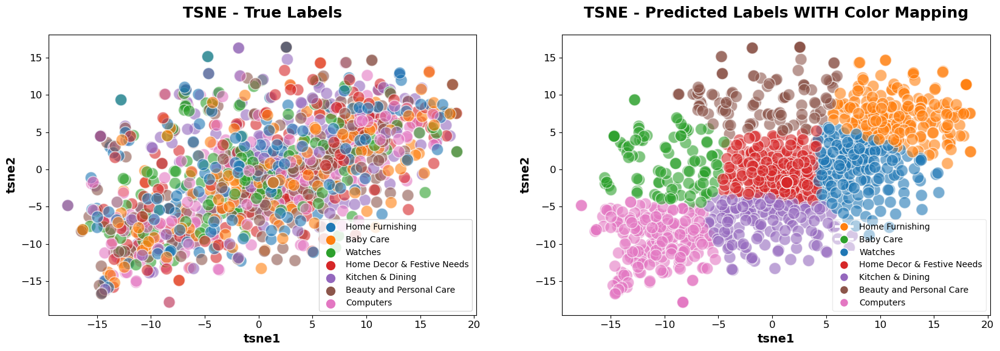

In [12]:
# ==================================================================================================
# ORB - FEATURESS EXTRACTION
# ==================================================================================================
def extract_features(image):
    orb = cv2.ORB_create()
    keypoints, descriptors = orb.detectAndCompute(image, None)
    return keypoints, descriptors

ari, best_accuracy, duration_extractor_time, nb_descriptors, nb_clusters = image_classification_cluster()

results_list.append({'EXTRACTOR METHOD': 'ORB', 'ARI': ari, 'Best Accuracy': best_accuracy, 'Temps de traitement': duration_extractor_time, 'Nb Descripteurs' : nb_descriptors, 'Nb Clusters' : nb_clusters})
df_results = pd.DataFrame(results_list) # Convert the list of dictionaries to a DataFrame



Nombre de descripteurs :  (307139, 61)
temps de traitement SIFT descriptor :            27.45 secondes
Nombre de clusters estimés :  554
Création de 554 clusters de descripteurs ...
temps de traitement kmeans :             2.89 secondes
0
No descriptors found in image: 0
No descriptors found in image: 10
No descriptors found in image: 37
No descriptors found in image: 66
100
200
300
400
500
No descriptors found in image: 520
600
700
800
900
No descriptors found in image: 968
No descriptors found in image: 983
1000
No descriptors found in image: 1014
No descriptors found in image: 1017
No descriptors found in image: 1043
No descriptors found in image: 1044
temps de création histogrammes :             1.04 secondes
Dimensions dataset avant réduction PCA :  (1050, 554)
Dimensions dataset après réduction PCA :  (1050, 438)
(1050, 3)


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:125: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


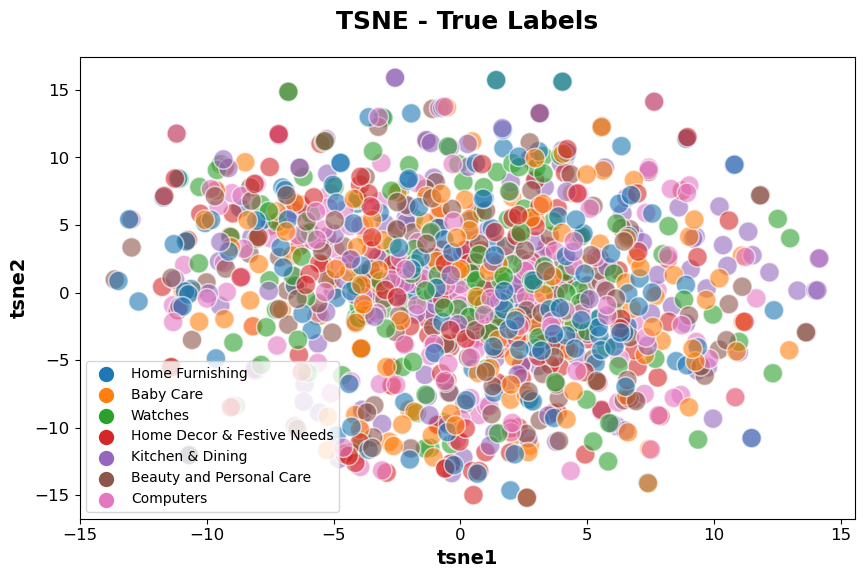

C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:146: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


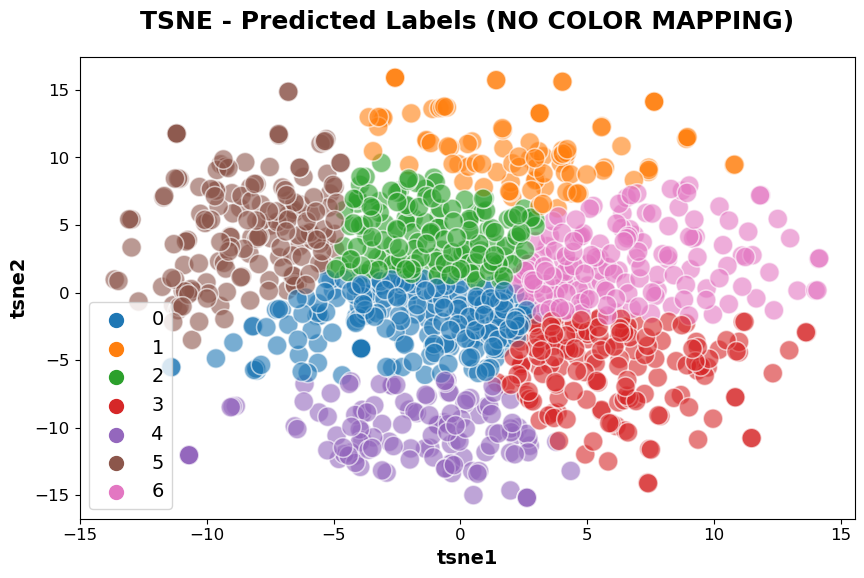

Adjusted Rand Index (ARI): 0.0003486494145393733
Best Label Mapping: {0: 'Watches', 1: 'Home Furnishing', 5: 'Computers', 4: 'Home Decor & Festive Needs', 2: 'Baby Care', 6: 'Kitchen & Dining', 3: 'Beauty and Personal Care'}
Best Accuracy: 0.18


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:220: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


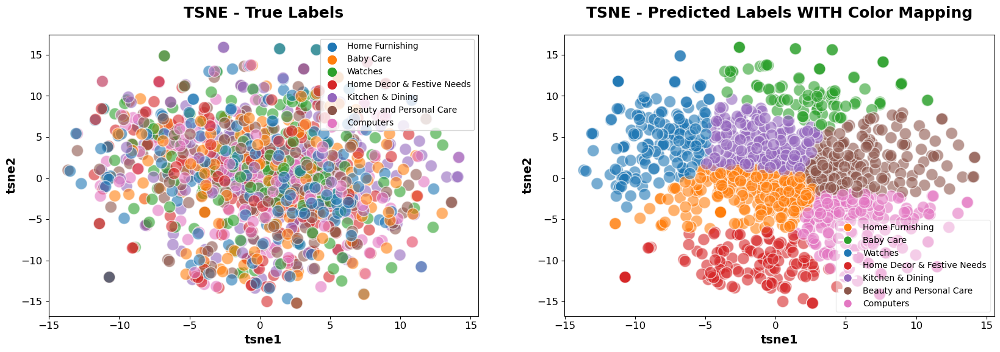

In [13]:
# ==================================================================================================
# AKAZE - FEATURESS EXTRACTION
# ==================================================================================================
def extract_features(image):
    akaze = cv2.AKAZE_create()
    keypoints, descriptors = akaze.detectAndCompute(image, None)
    return keypoints, descriptors

ari, best_accuracy, duration_extractor_time, nb_descriptors, nb_clusters = image_classification_cluster()

results_list.append({'EXTRACTOR METHOD': 'AKAZE', 'ARI': ari, 'Best Accuracy': best_accuracy, 'Temps de traitement': duration_extractor_time, 'Nb Descripteurs' : nb_descriptors, 'Nb Clusters' : nb_clusters})
df_results = pd.DataFrame(results_list) # Convert the list of dictionaries to a DataFrame



Nombre de descripteurs :  (1157843, 64)
temps de traitement SIFT descriptor :            51.05 secondes
Nombre de clusters estimés :  1076
Création de 1076 clusters de descripteurs ...
temps de traitement kmeans :            18.46 secondes
0
No descriptors found in image: 37
No descriptors found in image: 66
100
200
300
400
500
600
700
800
900
No descriptors found in image: 983
1000
No descriptors found in image: 1017
temps de création histogrammes :             6.46 secondes
Dimensions dataset avant réduction PCA :  (1050, 1076)
Dimensions dataset après réduction PCA :  (1050, 628)
(1050, 3)


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:125: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


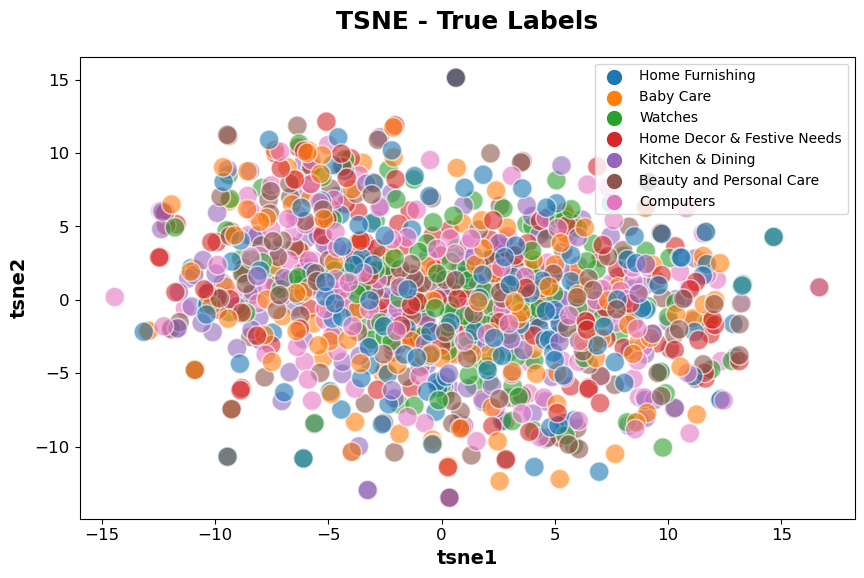

C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:146: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


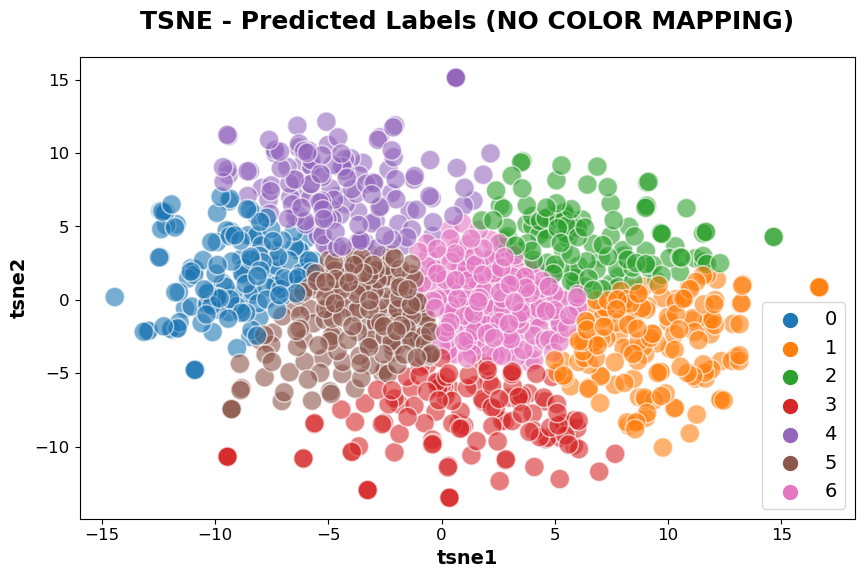

Adjusted Rand Index (ARI): 0.0019385264602230082
Best Label Mapping: {0: 'Kitchen & Dining', 6: 'Watches', 5: 'Baby Care', 2: 'Home Furnishing', 4: 'Home Decor & Festive Needs', 3: 'Beauty and Personal Care', 1: 'Computers'}
Best Accuracy: 0.18476190476190477


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:220: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


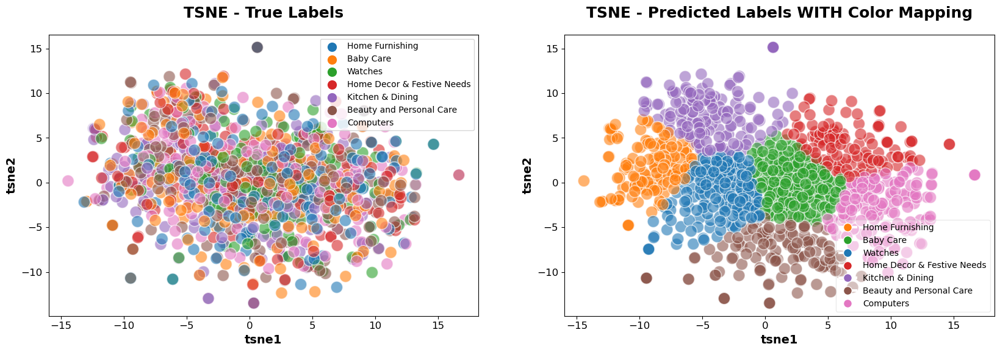

In [14]:
# ==================================================================================================
# BRISK - FEATURESS EXTRACTION
# ==================================================================================================
def extract_features(image):
    brisk = cv2.BRISK_create()
    keypoints, descriptors = brisk.detectAndCompute(image, None)
    return keypoints, descriptors

ari, best_accuracy, duration_extractor_time, nb_descriptors, nb_clusters = image_classification_cluster()

results_list.append({'EXTRACTOR METHOD': 'BRISK', 'ARI': ari, 'Best Accuracy': best_accuracy, 'Temps de traitement': duration_extractor_time, 'Nb Descripteurs' : nb_descriptors, 'Nb Clusters' : nb_clusters})
df_results = pd.DataFrame(results_list) # Convert the list of dictionaries to a DataFrame



Nombre de descripteurs :  (1848474, 64)
temps de traitement SIFT descriptor :            48.70 secondes
Nombre de clusters estimés :  1360
Création de 1360 clusters de descripteurs ...
temps de traitement kmeans :            37.02 secondes
0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :            10.46 secondes
Dimensions dataset avant réduction PCA :  (1050, 1360)
Dimensions dataset après réduction PCA :  (1050, 674)
(1050, 3)


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:125: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


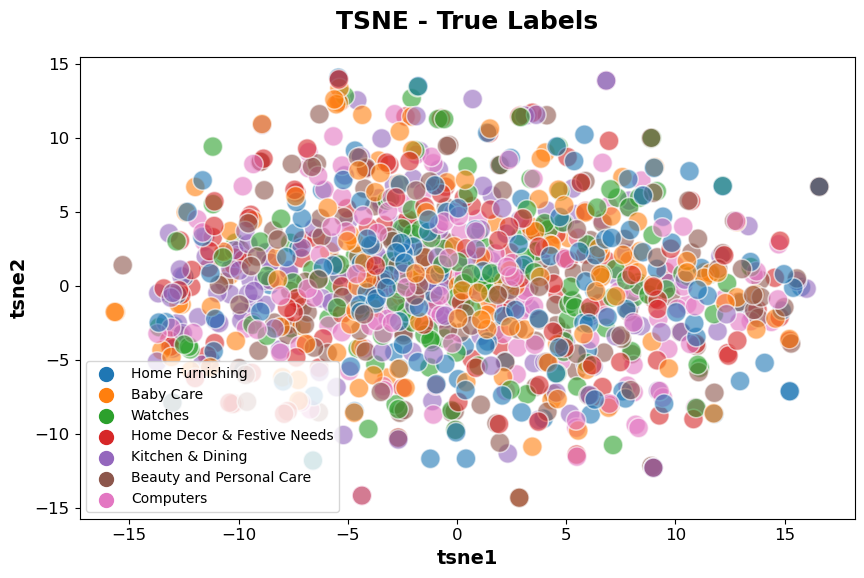

C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:146: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


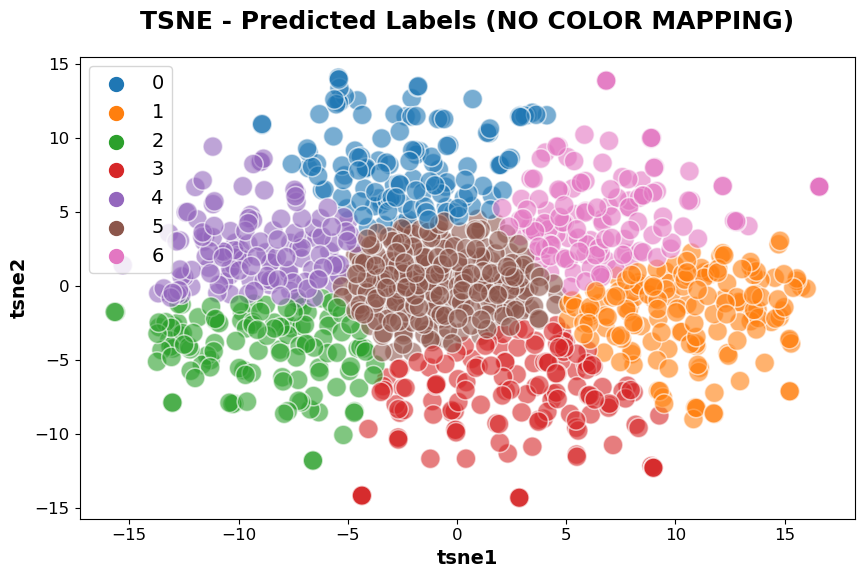

Adjusted Rand Index (ARI): 0.003207092751419381
Best Label Mapping: {4: 'Kitchen & Dining', 2: 'Baby Care', 3: 'Beauty and Personal Care', 0: 'Home Decor & Festive Needs', 5: 'Watches', 6: 'Home Furnishing', 1: 'Computers'}
Best Accuracy: 0.1961904761904762


C:\Users\Olivi\AppData\Local\Temp\ipykernel_1688\4051141929.py:220: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


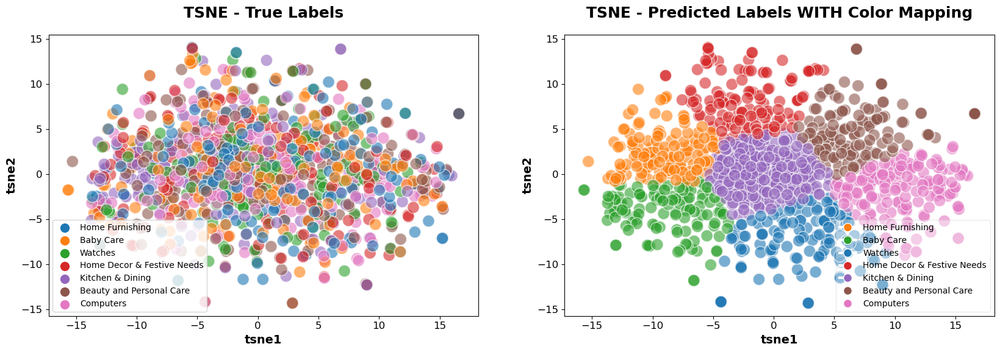

In [15]:
# ==================================================================================================
# FAST - FEATURESS EXTRACTION
# ==================================================================================================
def extract_features(image):
    fast = cv2.FastFeatureDetector_create()
    keypoints = fast.detect(image, None)
    _, descriptors = cv2.BRISK_create().compute(image, keypoints)
    return keypoints, descriptors

ari, best_accuracy, duration_extractor_time, nb_descriptors, nb_clusters = image_classification_cluster()

results_list.append({'EXTRACTOR METHOD': 'FAST', 'ARI': ari, 'Best Accuracy': best_accuracy, 'Temps de traitement': duration_extractor_time, 'Nb Descripteurs' : nb_descriptors, 'Nb Clusters' : nb_clusters})
df_results = pd.DataFrame(results_list) # Convert the list of dictionaries to a DataFrame


### I.1.1. RESULTS

In [16]:
pd.options.display.float_format = '{:.2f}'.format
# Rename the columns
df_results = df_results.rename(columns={'EXTRACTOR METHOD': 'Extractor Method', 'Best Accuracy': 'Accuracy', 'Nb Clusters' : 'Nb of Visual Words'})

display(df_results)

,Extractor Method,ARI,Accuracy,Temps de traitement,Nb Descripteurs,Nb of Visual Words
0,SIFT,0.01,0.20,36.54,"(350279, 128)",592
1,ORB,0.00,0.19,22.18,"(436277, 32)",661
2,AKAZE,0.00,0.18,27.45,"(307139, 61)",554
3,BRISK,0.00,0.18,51.05,"(1157843, 64)",1076
4,FAST,0.00,0.20,48.70,"(1848474, 64)",1360
